##### Author: Jimin Kim (jk55@uw.edu)
##### Version 1.5.0

# Lab 3 Report

## Group Members: Jakob, Jeremy
## Group Name for Leaderboard: 

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import numpy as np

from numpy.typing import NDArray
from typing import List, Any
from PIL import Image 
from PIL.ImageFile import ImageFile

In [2]:
from IPython.display import Image as ipyimage #For displaying images in colab jupyter cell

### Exercise 1: Generalized function for subsetting pixels

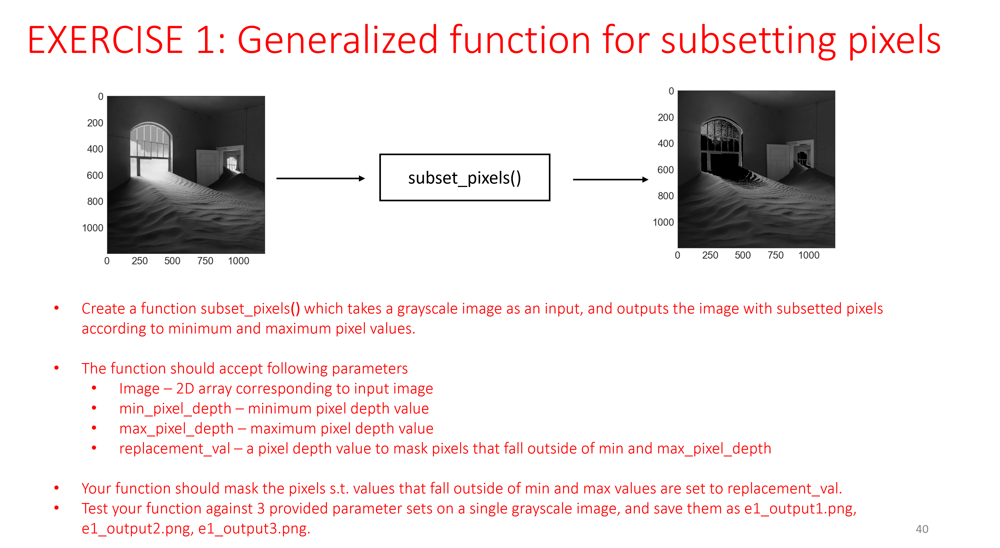

In [3]:
ipyimage('lab3_exercise1.PNG', width = 1000)

In [4]:
# NOTE: Modified to not overwrite e1_img because of typing issue.
sample_image_1 = Image.open('sample_image_1.jpg').convert('L')
e1_img = np.array(sample_image_1)     # 8-bit code grayscale

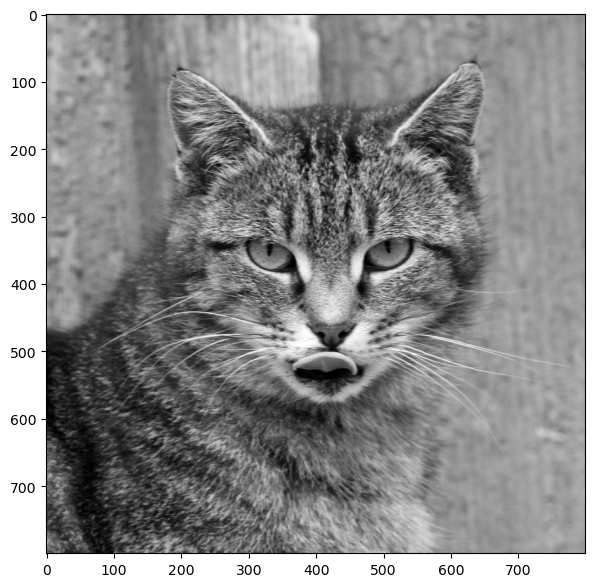

In [5]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e1_img, cmap = 'gray')

In [6]:
def subset_pixels(image:NDArray[Any], min_pixel_depth:int, max_pixel_depth:int, replacement_val:int) -> NDArray[Any]:
    """Takes a grayscale image as an input, and outputs the image with subsetted pixels 
    according to minimum and maximum pixel values.

    Args:
        image (NDArray[Any]):  2D array corresponding to input image (Grayscale only)
        min_pixel_depth (int): minimum pixel depth value
        max_pixel_depth (int): maximum pixel depth value
        replacement_val (int):  a pixel depth value to mask pixels that fall outside of min and max_pixel_depth

    Returns:
        NDArray[Any]: image with subsetted pixels
    """
    data = image.copy()
    mask = (image < min_pixel_depth) | (image > max_pixel_depth)
    data[mask] = replacement_val
    return data

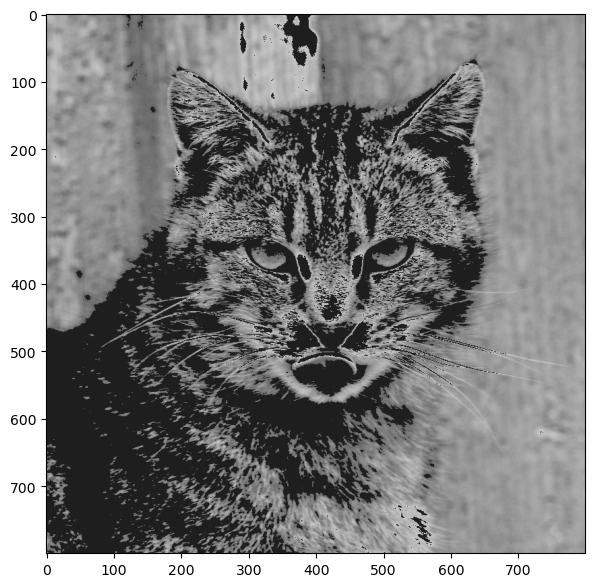

In [7]:
# min_pixel_depth = 100, max_pixel_depth = 200, replacement_val = 30

fig = plt.figure(figsize=(7, 7))

e1_output2 = subset_pixels(image = e1_img, min_pixel_depth = 100, max_pixel_depth = 200, replacement_val = 30)

plt.imshow(e1_output2, cmap = 'gray', vmin = 0, vmax = 255)

plt.savefig('e1_output2.png')

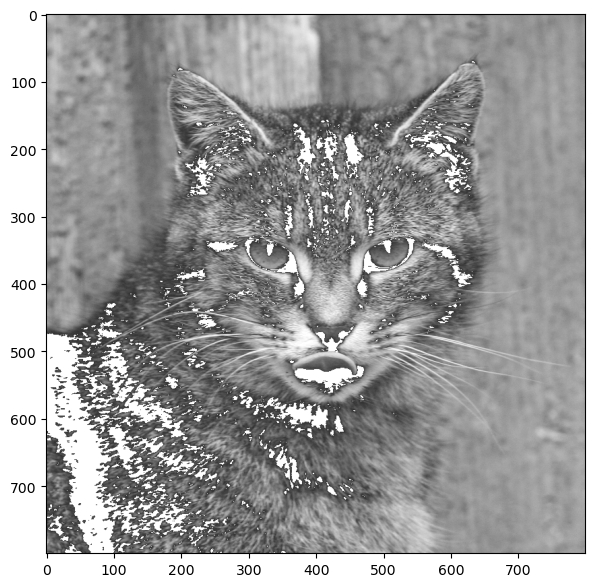

In [8]:
# min_pixel_depth = 50, max_pixel_depth = 255, replacement_val = 255

fig = plt.figure(figsize=(7, 7))

e1_output3 = subset_pixels(image = e1_img, min_pixel_depth = 50, max_pixel_depth = 255, replacement_val = 255)

plt.imshow(e1_output3, cmap = 'gray', vmin = 0, vmax = 255)

plt.savefig('e1_output3.png')

### Exercise 2: Thumbnail generator function

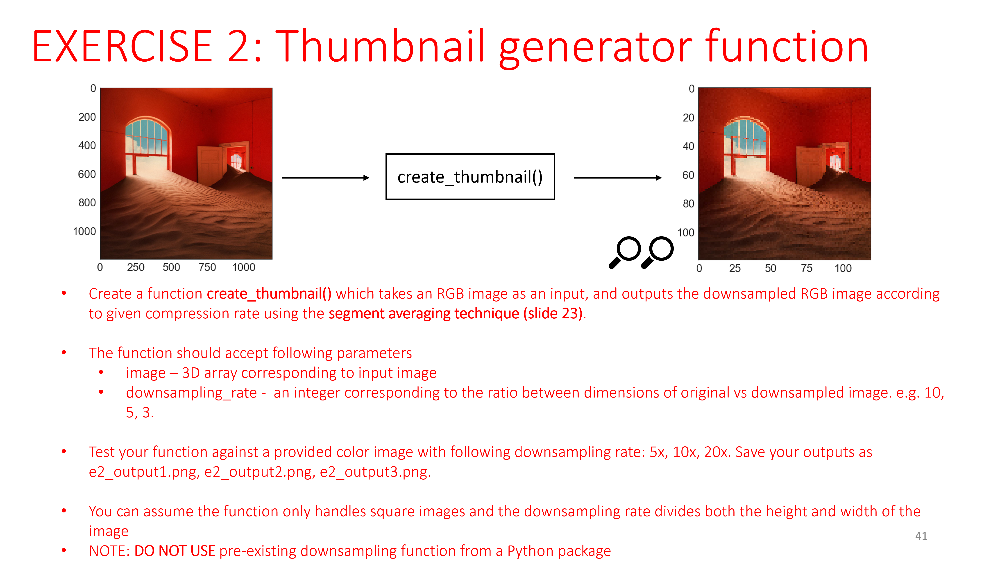

In [9]:
ipyimage('lab3_exercise2.PNG', width = 1000)

In [10]:
sample_image_2 = mpimg.imread('sample_image_2.jpg')
e2_img = np.array(sample_image_2)     

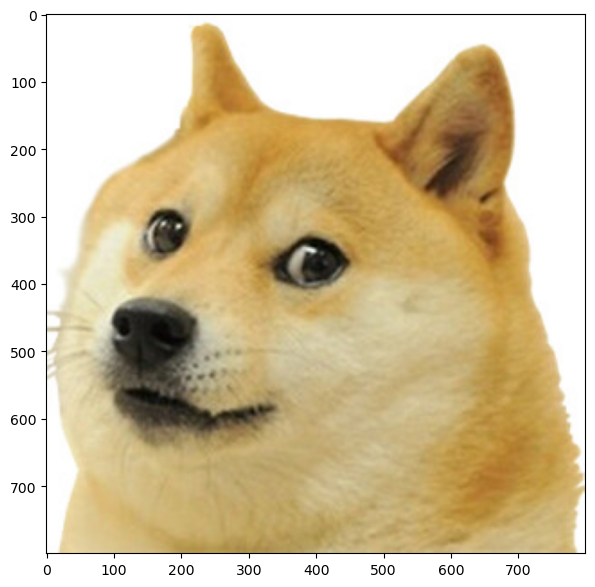

In [11]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e2_img)

In [12]:
def create_thumbnail(image:NDArray[Any], downsampling_rate:int) -> NDArray[Any]:
    """
    ## Requirement
    Takes an RGB image as an input, and outputs the downsampled RGB image according 
to given compression rate using the segment averaging technique.

    ## Functionality
    This function downsamples the input RGB image by dividing it into square segments by given downsampling rate.
    Therefore, left over pixels are discarded at the end of each axis (width and height)

    Args:
        image (NDArray[Any]): 3D array corresponding to input image
        downsampling_rate (int): An integer corresponding to the ratio between dimensions of original vs downsampled image. e.g. 10, 
5, 3.

    Returns:
        NDArray[Any]: Downsampled RGB image
    """
    data = image.copy()
    height, width, pixel = data.shape
    segment_length = downsampling_rate
    
    # Crop the image where downsampling could be done.
    height_limit = height // segment_length * segment_length
    width_limit = width // segment_length * segment_length
    cropped = data[:height_limit, :width_limit, :]

    # NOTE: Break down the image into each segments
    # -------------------------------------------
    # RESHAPED - (seg_xn, seg_yn, seg)
    #               seg_yn
    #       [[seg, seg, seg, seg],
    #        [seg, seg, seg, seg],
    # seg_xn [seg, seg, seg, seg],
    #        [seg, seg, seg, seg]]
    # -------------------------------------------
    # SEG - (segment_length, segment_length, pixel)
    # segment length is downsampling rate.
    #                 seg_y
    #      [[Pixel, Pixel, Pixel, Pixel],
    #       [Pixel, Pixel, Pixel, Pixel],
    # seg_x [Pixel, Pixel, Pixel, Pixel],
    #       [Pixel, Pixel, Pixel, Pixel]]
    # -------------------------------------------
    # PIXEL - (Red, Green, Blue)
    #              Channels
    #              [R,G,B]
    # -------------------------------------------
    seg_yn = height_limit // segment_length # number of segments along height
    seg_xn = width_limit // segment_length # number of segments along width
    reshaped = cropped.reshape( # refer to note above.
        seg_yn,
        segment_length, 
        seg_xn,
        segment_length, 
        pixel,
        )
    # return the mean value of each segment as a pixel.
    return reshaped.mean(axis=(1, 3)).astype(image.dtype) # make sure the data type is the same.


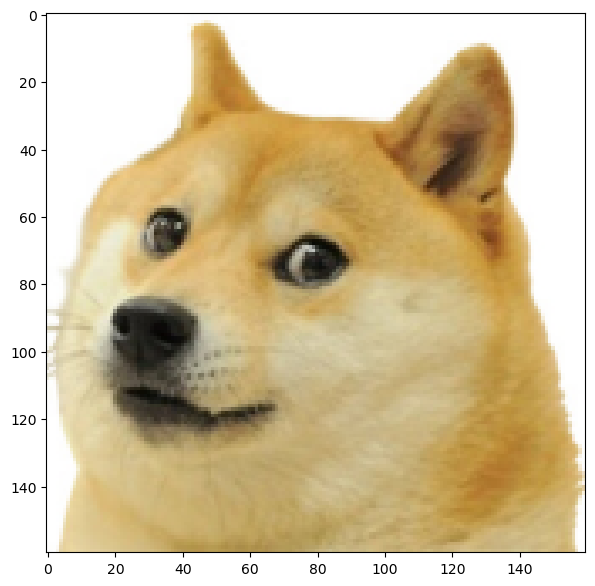

In [13]:
# downsampling rate x5

fig = plt.figure(figsize=(7, 7))

e2_output1 = create_thumbnail(image = e2_img, downsampling_rate = 5)

plt.imshow(e2_output1, vmin = 0, vmax = 255)

plt.savefig('e2_output1.png')

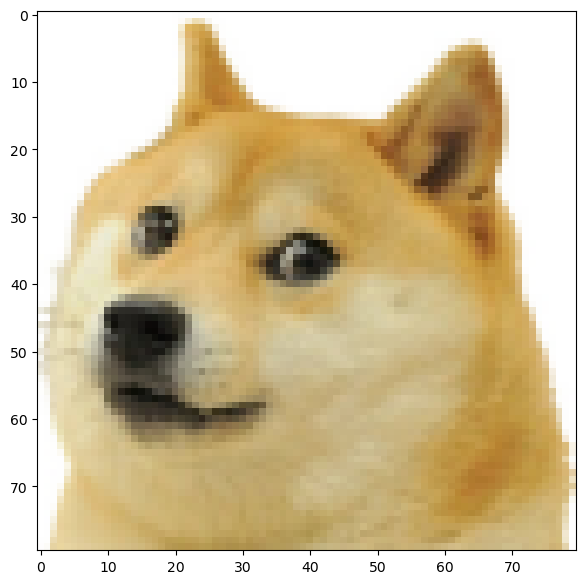

In [14]:
# downsampling rate x10

fig = plt.figure(figsize=(7, 7))

e2_output2 = create_thumbnail(image = e2_img, downsampling_rate = 10)

plt.imshow(e2_output2, vmin = 0, vmax = 255)

plt.savefig('e2_output2.png')

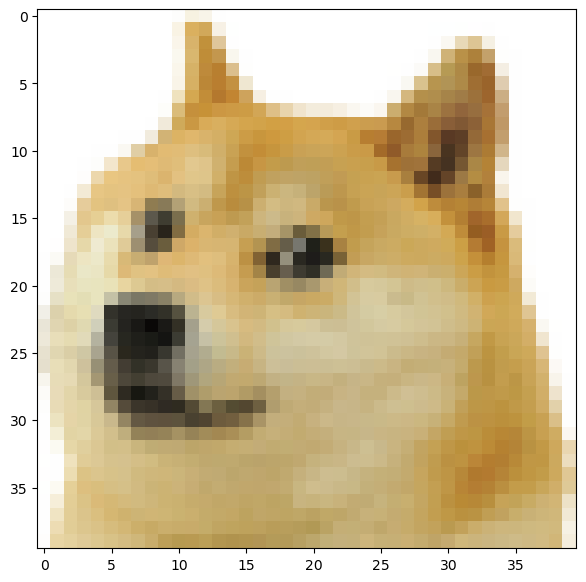

In [15]:
# downsampling rate x20

fig = plt.figure(figsize=(7, 7))

e2_output3 = create_thumbnail(image = e2_img, downsampling_rate = 20)

plt.imshow(e2_output3, vmin = 0, vmax = 255)

plt.savefig('e2_output3.png')

## Extra credit: Code efficiency
### Achieve a runtime speed of < 100ms

In [16]:
timeit -n 1 -r 100 e2_output2 = create_thumbnail(image = e2_img, downsampling_rate = 5)

12.3 ms ± 459 μs per loop (mean ± std. dev. of 100 runs, 1 loop each)


### Exercise 3: Generalized image blender function

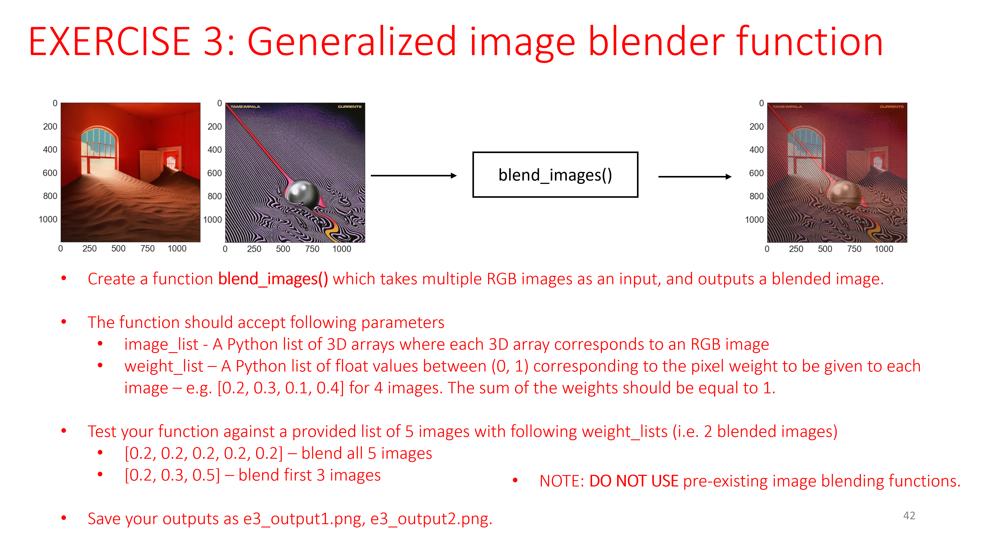

In [17]:
ipyimage('lab3_exercise3.PNG', width = 1000)

In [18]:
e3_img1 = mpimg.imread('sample_image_1.jpg')
e3_img2 = mpimg.imread('sample_image_2.jpg')
e3_img3 = mpimg.imread('sample_image_3.jpg')
e3_img4 = mpimg.imread('sample_image_4.jpg')
e3_img5 = mpimg.imread('sample_image_5.jpg')

e3_img1 = np.array(e3_img1)     
e3_img2 = np.array(e3_img2)     
e3_img3 = np.array(e3_img3)     
e3_img4 = np.array(e3_img4)     
e3_img5 = np.array(e3_img5)     

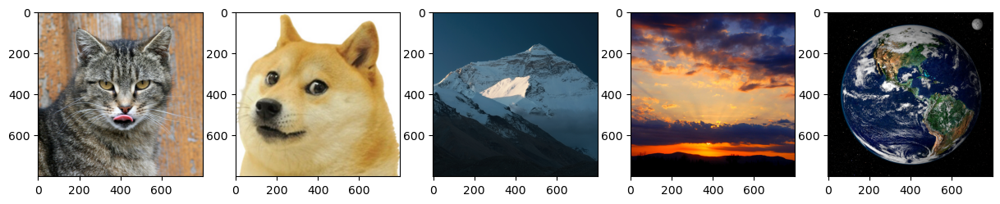

In [19]:
fig = plt.figure(figsize=(15, 15))

plt.subplot(1,5,1)
plt.imshow(e3_img1, vmin = 0, vmax = 255)

plt.subplot(1,5,2)
plt.imshow(e3_img2, vmin = 0, vmax = 255)

plt.subplot(1,5,3)
plt.imshow(e3_img3, vmin = 0, vmax = 255)

plt.subplot(1,5,4)
plt.imshow(e3_img4, vmin = 0, vmax = 255)

plt.subplot(1,5,5)
plt.imshow(e3_img5, vmin = 0, vmax = 255)

In [20]:
def blend_images(image_list:List[NDArray[Any]], weight_list:List[List[float]]) -> NDArray[Any]:
    """Takes multiple RGB images as an input, and outputs a blended image according to given pixel weights for each image.

    Args:
        image_list (List[NDArray[Any]]): A Python list of 3D arrays where each 3D array corresponds to an RGB image
        weight_list (List[List[float]]): A Python list of float values between (0, 1) corresponding to the pixel weight to be given to each image in image_list.

    Returns:
        NDArray[Any]: Blended RGB image
    """
    output = image_list[0].copy() * weight_list[0]
    for seq, weight in enumerate(weight_list[1:], start=1): # skip 0
        output += image_list[seq] * weight
    return output.astype(image_list[0].dtype)

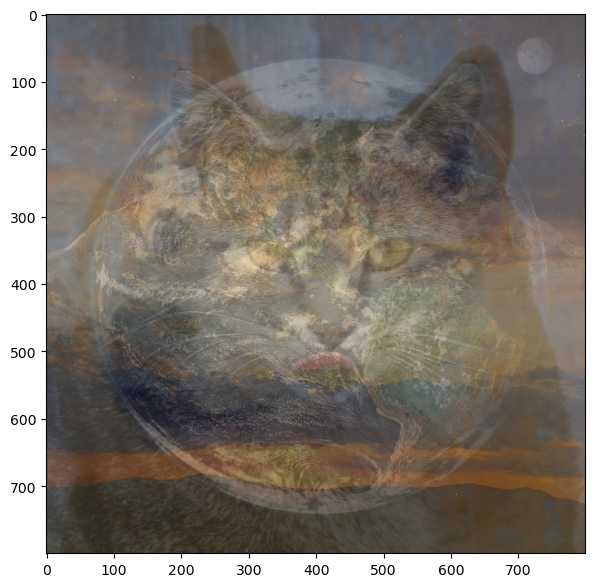

In [21]:
# Blend all 5 images with equal weights

e3_part1_image_list =[e3_img1, e3_img2, e3_img3, e3_img4, e3_img5]
e3_part1_weight_list = [0.2, 0.2, 0.2, 0.2, 0.2]

e3_output1 = blend_images(image_list = e3_part1_image_list, weight_list = e3_part1_weight_list)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e3_output1, vmin = 0, vmax = 255)

plt.savefig('e3_output1.png')

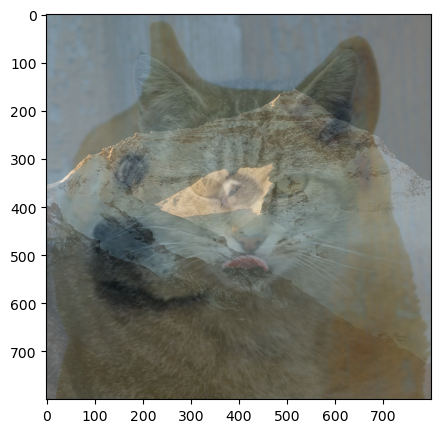

In [22]:
# Blend first 3 images with different weights

e3_part2_image_list =[e3_img1, e3_img2, e3_img3]
e3_part2_weight_list = [0.2, 0.3, 0.5]

e3_output2 = blend_images(image_list = e3_part2_image_list, weight_list = e3_part2_weight_list)

fig = plt.figure(figsize=(5, 5))

plt.imshow(e3_output2, vmin = 0, vmax = 255)

plt.savefig('e3_output2.png')

### Exercise 4: Image rotation function

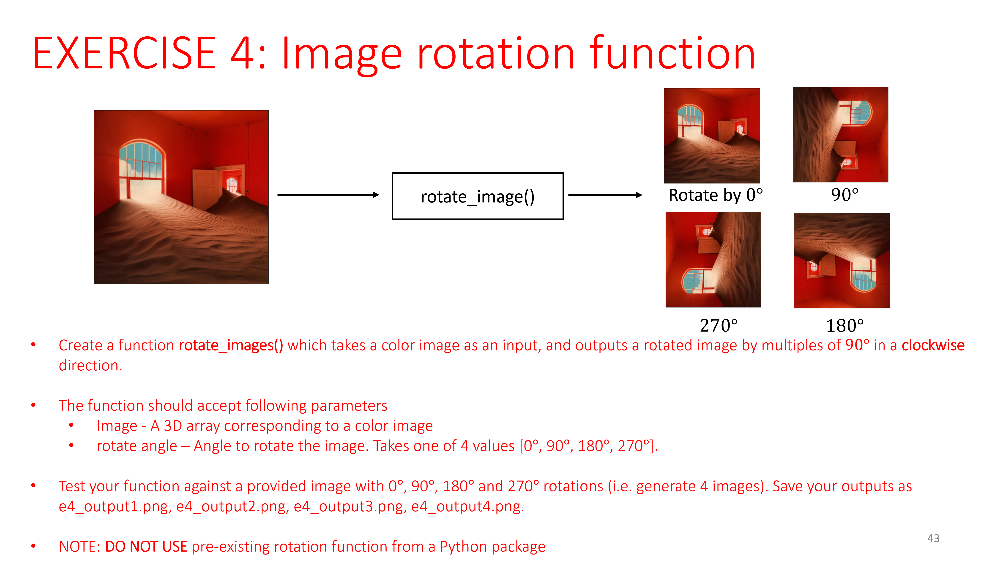

In [23]:
ipyimage('lab3_exercise4.PNG', width = 1000)

In [24]:
e4_img = mpimg.imread('sample_image_2.jpg')
e4_img = np.array(e4_img)     

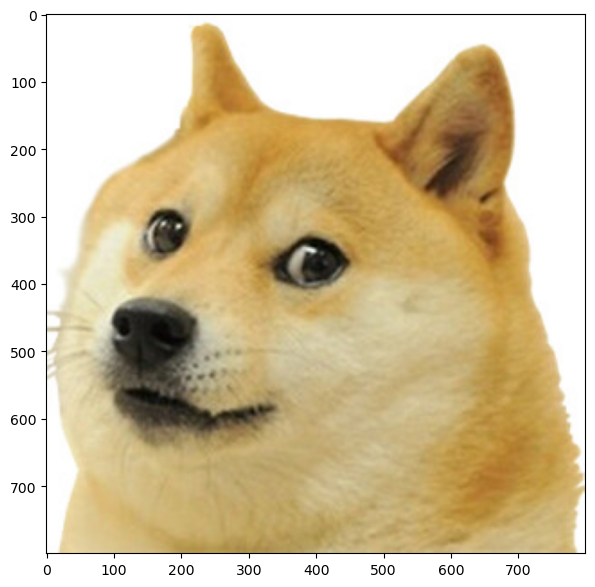

In [25]:
fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_img, vmin = 0, vmax = 255)

In [26]:
def rotate_image(image:NDArray[Any], rotate_angle:int) -> NDArray[Any]:
    """Takes a color image as an input, and outputs a rotated image by multiples of 90° in a clockwise 
direction

    Args:
        image (NDArray[Any]): A 3D array corresponding to a color image
        rotate_angle (int): Angle to rotate the image. Takes one of 4 values [0°, 90°, 180°, 270°].

    Returns:
        NDArray[Any]: _description_
    """
    if rotate_angle not in [0, 90, 180, 270]:
        raise ValueError("rotate_angle must be one of the following values: 0, 90, 180, 270")
    rotated = image.copy()
    match rotate_angle:
        case 90: 
            # flip y axis order and swap y and x axis -------
            # [[0,1],  flip_y   [[2,3],   transpose   [[2,0],
            #  [2,3]]  ------>   [0,1]]   --------->   [3,1]]
            # -----------------------------------------------
            return np.transpose(rotated[::-1, :, :], (1, 0, 2))
        case 180:
            # flip both y axis and x axis order -------------
            # [[0,1],  flip_y   [[2,3],   flip_x   [[3,2],
            #  [2,3]]  ------>   [0,1]]   ------>   [1,0]]
            # -----------------------------------------------
            return rotated[::-1, ::-1, :]
        case 270: 
            # flip x axis order and swap y and x axis -------
            # [[0,1],  flip_x   [[1,0],   transpose  [[1,3],
            #  [2,3]]  ------>   [3,2]]   --------->  [0,2]]
            # -----------------------------------------------
            return np.transpose(rotated[:, ::-1, :], (1, 0, 2))
    return rotated



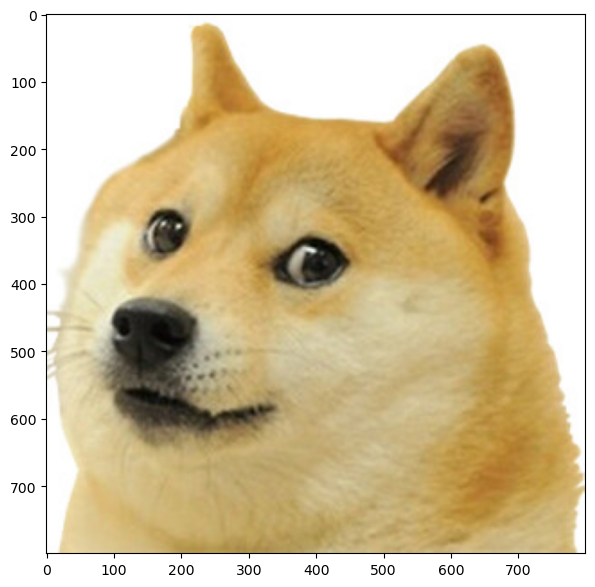

In [27]:
# Rotate the image by 0 degrees - This should result in identity

e4_output1 = rotate_image(image = e4_img, rotate_angle = 0)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output1, vmin = 0, vmax = 255)

plt.savefig('e4_output1.png')

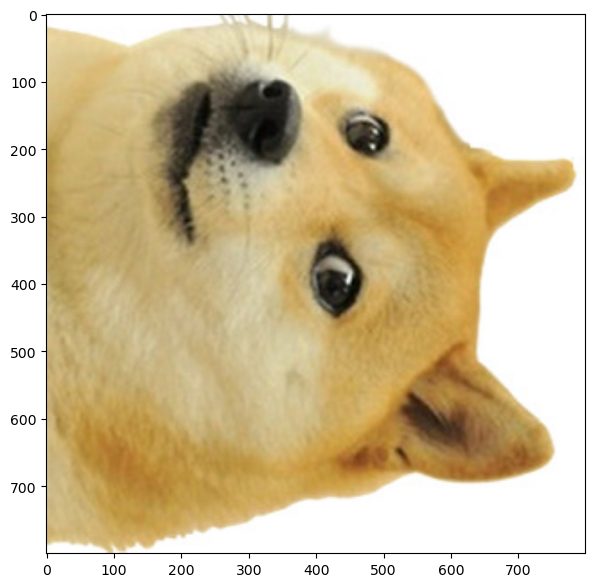

In [28]:
# Rotate the image by 90 degrees

e4_output2 = rotate_image(image = e4_img, rotate_angle = 90)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output2, vmin = 0, vmax = 255)

plt.savefig('e4_output2.png')

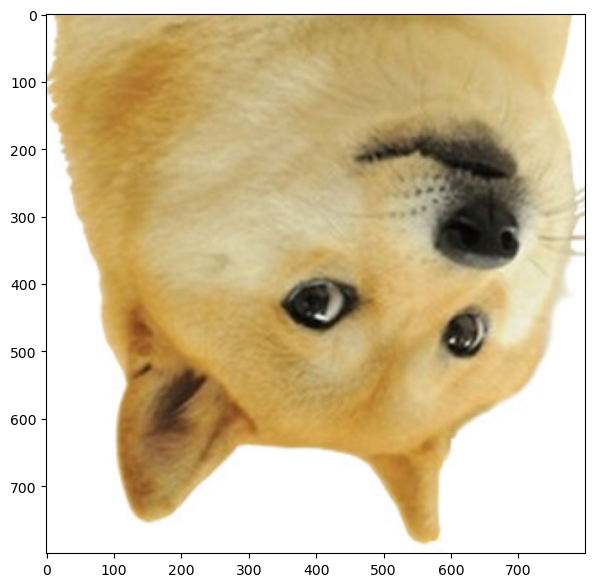

In [29]:
# Rotate the image by 180 degrees

e4_output3 = rotate_image(image = e4_img, rotate_angle = 180)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output3, vmin = 0, vmax = 255)

plt.savefig('e4_output3.png')

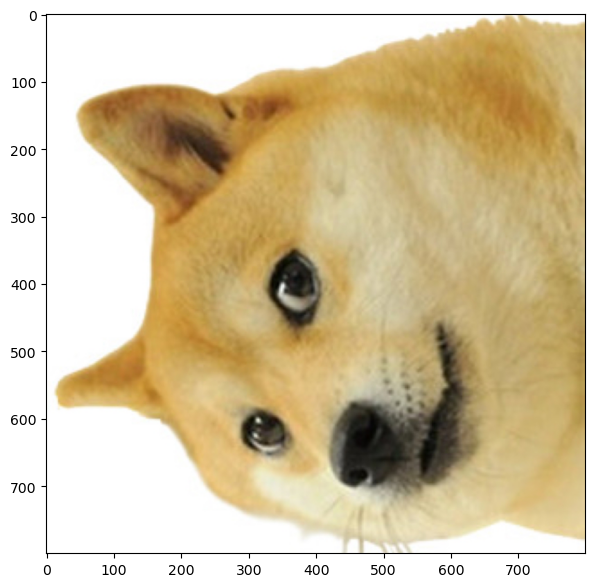

In [30]:
# Rotate the image by 270 degrees

e4_output4 = rotate_image(image = e4_img, rotate_angle = 270)

fig = plt.figure(figsize=(7, 7))

plt.imshow(e4_output4, vmin = 0, vmax = 255)

plt.savefig('e4_output4.png')

## Extra credit: Code efficiency
### Achieve a runtime speed of < 5ms

In [31]:
timeit -n 1 -r 7 e4_output2 = rotate_image(image = e4_img, rotate_angle = 90)

The slowest run took 6.39 times longer than the fastest. This could mean that an intermediate result is being cached.
104 μs ± 92.9 μs per loop (mean ± std. dev. of 7 runs, 1 loop each)


### Exercise 5: 2D Gaussian image generator

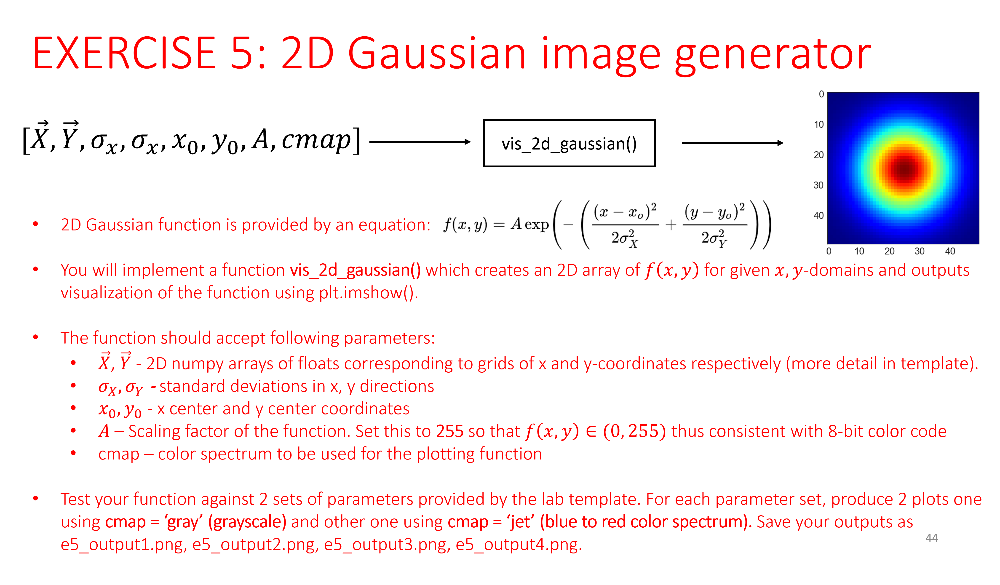

In [32]:
ipyimage('lab3_exercise5.PNG', width = 1000)

In [33]:
x_range = np.arange(-25, 25, 1)
y_range = np.arange(-25, 25, 1)[::-1]

X, Y = np.meshgrid(x_range, y_range) # More detail on documentation 
                                     # https://numpy.org/doc/stable/reference/generated/numpy.meshgrid.html

In [34]:
print(X, X.shape) # Set of x-coordinates in the function domain     

[[-25 -24 -23 ...  22  23  24]
 [-25 -24 -23 ...  22  23  24]
 [-25 -24 -23 ...  22  23  24]
 ...
 [-25 -24 -23 ...  22  23  24]
 [-25 -24 -23 ...  22  23  24]
 [-25 -24 -23 ...  22  23  24]] (50, 50)


In [35]:
print(Y, Y.shape) # Set of y-coordinates in the function domain   

[[ 24  24  24 ...  24  24  24]
 [ 23  23  23 ...  23  23  23]
 [ 22  22  22 ...  22  22  22]
 ...
 [-23 -23 -23 ... -23 -23 -23]
 [-24 -24 -24 ... -24 -24 -24]
 [-25 -25 -25 ... -25 -25 -25]] (50, 50)


In [36]:
def vis_2d_gaussian(x:NDArray[Any], y:NDArray[Any], sigma_x:float, sigma_y:float, x0:int, y0:int, A:int=255, cmap:str='red') -> None:
    """Visualizes a 2D Gaussian function on a meshgrid defined by X and Y.

    Args:
        X (NDArray[Any]): 2D array representing x-coordinates in the function domain
        Y (NDArray): 2D array representing y-coordinates in the function domain 
        sigma_x (float): Standard deviation of the Gaussian in the x-direction
        sigma_y (float): Standard deviation of the Gaussian in the y-direction
        x0 (int): x-coordinate of the Gaussian center
        y0 (int): y-coordinate of the Gaussian center
        A (int): Scaling factor of the function. Defaults to 255.
        cmap (str, optional):  color spectrum to be used for the plotting function. Defaults to 'red'.
    
    Returns:
        None: Displays a 2D plot of the Gaussian function.
    """
    
    
    # Calculate the 2D Gaussian function
    gaussian = A * np.exp(-(((x - x0)**2 / (2 * sigma_x**2)) + 
                           ((y - y0)**2 / (2 * sigma_y**2))))
    plt.legend()
    plt.imshow(gaussian, cmap=cmap)


/var/folders/3r/c55jk9pj7fd6hbf74bz39mgh0000gn/T/ipykernel_23411/1302784707.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


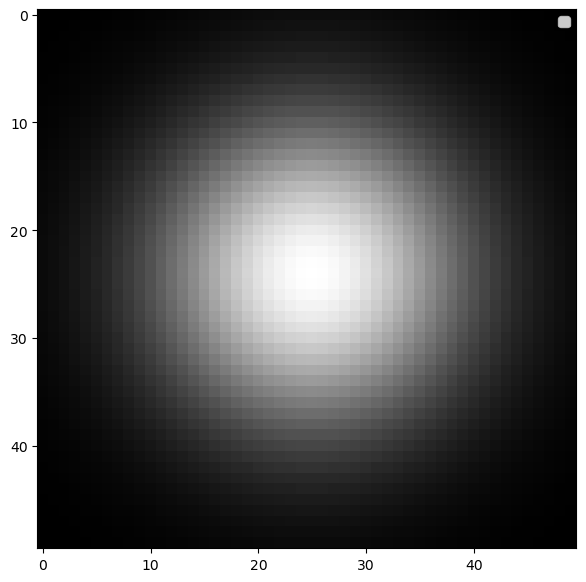

In [37]:
# First parameter set: sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0
# cmap = 'gray'

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0, A = 255, cmap = 'gray')

plt.savefig('e5_output1.png')

/var/folders/3r/c55jk9pj7fd6hbf74bz39mgh0000gn/T/ipykernel_23411/1302784707.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


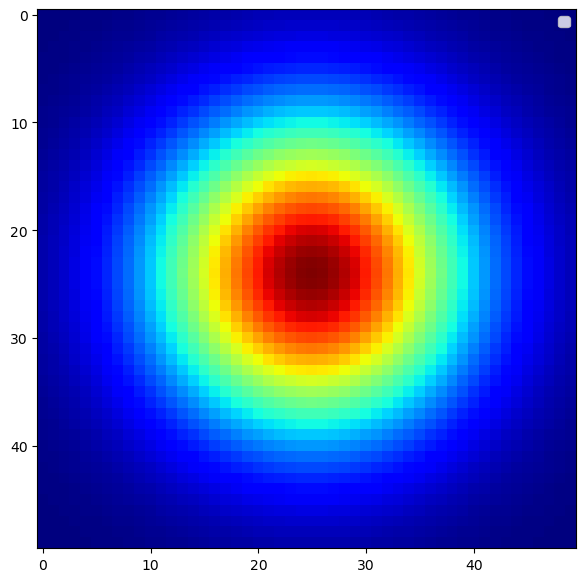

In [38]:
# First parameter set
# cmap = 'jet'

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 10, sigma_y = 10, x0 = 0, y0 = 0, A = 255, cmap = 'jet')

plt.savefig('e5_output2.png')

/var/folders/3r/c55jk9pj7fd6hbf74bz39mgh0000gn/T/ipykernel_23411/1302784707.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


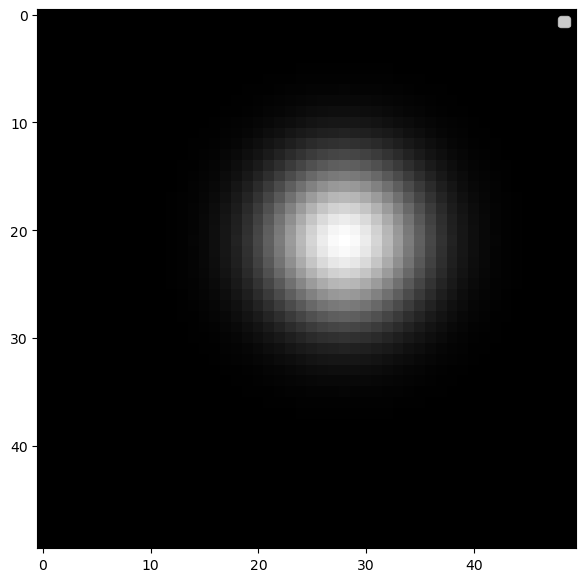

In [45]:
# Second parameter set: sigma_x = 5, sigma_y = 5, x0 = 3, y = 3
# grayscale color specturm

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 5, sigma_y = 5, x0 = 3, y0 = 3, A = 255, cmap = 'gray')

plt.savefig('e5_output3.png')

/var/folders/3r/c55jk9pj7fd6hbf74bz39mgh0000gn/T/ipykernel_23411/1302784707.py:22: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


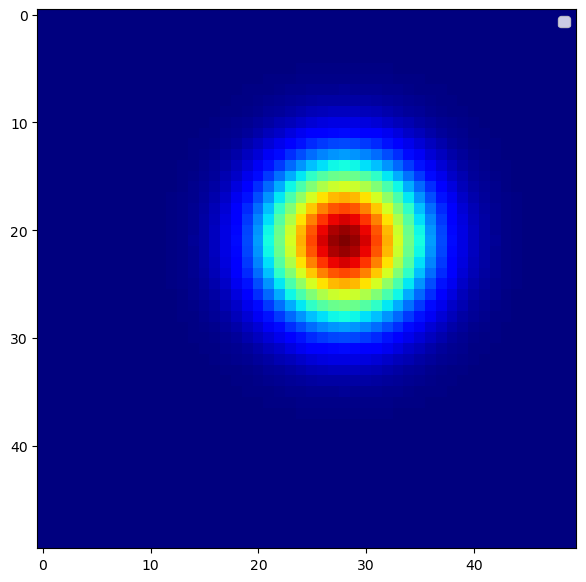

In [40]:
# Second parameter set: sigma_x = 5, sigma_y = 5, x0 = 3, y = 3
# jet color specturm

fig = plt.figure(figsize=(7, 7))

vis_2d_gaussian(X, Y, sigma_x = 5, sigma_y = 5, x0 = 3, y0 = 3, A = 255, cmap = 'jet')

plt.savefig('e5_output4.png')